In [1]:
# Import the required libraries

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import  figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjusts the configuration of the plots we will create

#Reading the data

df = pd.read_csv('movies.csv')

In [2]:
# Looking at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [3]:
#Identifying the missing data

for col in df.columns:
    percent_missing = np.mean(df[col].isnull())*100
    print('{} - {}%'.format(col,percent_missing))

name - 0.0%
rating - 1.004173187271779%
genre - 0.0%
year - 0.0%
released - 0.02608242044861763%
score - 0.03912363067292645%
votes - 0.03912363067292645%
director - 0.0%
writer - 0.03912363067292645%
star - 0.013041210224308816%
country - 0.03912363067292645%
budget - 28.31246739697444%
gross - 2.464788732394366%
company - 0.2217005738132499%
runtime - 0.05216484089723526%


In [4]:
# Data types for our columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [5]:
df.describe(include = 'all')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
count,7668,7591,7668,7668.000000,7666,7665.000000,7.665000e+03,7668,7665,7667,7665,5.497000e+03,7.479000e+03,7651,7664.000000
unique,7512,12,19,NaN,3414,NaN,NaN,2949,4535,2814,59,NaN,NaN,2385,NaN
top,Nobody's Fool,R,Comedy,NaN,"February 14, 1986 (United States)",NaN,NaN,Woody Allen,Woody Allen,Nicolas Cage,United States,NaN,NaN,Universal Pictures,NaN
freq,3,3697,2245,NaN,9,NaN,NaN,38,37,43,5475,NaN,NaN,377,NaN
mean,NaN,NaN,NaN,2000.405451,NaN,6.390411,8.810850e+04,NaN,NaN,NaN,NaN,3.558988e+07,7.850054e+07,NaN,107.261613
std,NaN,NaN,NaN,11.153508,NaN,0.968842,1.633238e+05,NaN,NaN,NaN,NaN,4.145730e+07,1.657251e+08,NaN,18.581247
min,NaN,NaN,NaN,1980.000000,NaN,1.900000,7.000000e+00,NaN,NaN,NaN,NaN,3.000000e+03,3.090000e+02,NaN,55.000000
25%,NaN,NaN,NaN,1991.000000,NaN,5.800000,9.100000e+03,NaN,NaN,NaN,NaN,1.000000e+07,4.532056e+06,NaN,95.000000
50%,NaN,NaN,NaN,2000.000000,NaN,6.500000,3.300000e+04,NaN,NaN,NaN,NaN,2.050000e+07,2.020576e+07,NaN,104.000000
75%,NaN,NaN,NaN,2010.000000,NaN,7.100000,9.300000e+04,NaN,NaN,NaN,NaN,4.500000e+07,7.601669e+07,NaN,116.000000


From the above we can identify that there are repeated values in the movie name field

In [6]:
#Removing the duplicates
df = df.drop_duplicates(subset =['name'],keep = 'first')

In [7]:
#Identifying the new data
df.describe(include = "all")

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
count,7512,7436,7512,7512.000000,7510,7509.000000,7.509000e+03,7512,7509,7511,7509,5.366000e+03,7.323000e+03,7495,7508.000000
unique,7512,12,19,NaN,3386,NaN,NaN,2917,4488,2784,59,NaN,NaN,2358,NaN
top,The Shining,R,Comedy,NaN,"February 14, 1986 (United States)",NaN,NaN,Woody Allen,Woody Allen,Nicolas Cage,United States,NaN,NaN,Universal Pictures,NaN
freq,1,3632,2218,NaN,9,NaN,NaN,38,37,42,5364,NaN,NaN,373,NaN
mean,NaN,NaN,NaN,2000.227769,NaN,6.392476,8.720904e+04,NaN,NaN,NaN,NaN,3.521071e+07,7.683117e+07,NaN,107.163559
std,NaN,NaN,NaN,11.145408,NaN,0.968965,1.625851e+05,NaN,NaN,NaN,NaN,4.119872e+07,1.621931e+08,NaN,18.527652
min,NaN,NaN,NaN,1980.000000,NaN,1.900000,7.000000e+00,NaN,NaN,NaN,NaN,3.000000e+03,3.090000e+02,NaN,55.000000
25%,NaN,NaN,NaN,1991.000000,NaN,5.800000,8.900000e+03,NaN,NaN,NaN,NaN,1.000000e+07,4.410766e+06,NaN,95.000000
50%,NaN,NaN,NaN,2000.000000,NaN,6.500000,3.200000e+04,NaN,NaN,NaN,NaN,2.000000e+07,1.974592e+07,NaN,104.000000
75%,NaN,NaN,NaN,2010.000000,NaN,7.100000,9.200000e+04,NaN,NaN,NaN,NaN,4.375000e+07,7.402120e+07,NaN,116.000000


In [8]:
#Checking the null value percentage again
for col in df.columns:
    percent_missing = np.mean(df[col].isnull())*100
    print('{} - {}%'.format(col,percent_missing))

name - 0.0%
rating - 1.0117145899893505%
genre - 0.0%
year - 0.0%
released - 0.026624068157614485%
score - 0.039936102236421724%
votes - 0.039936102236421724%
director - 0.0%
writer - 0.039936102236421724%
star - 0.013312034078807242%
country - 0.039936102236421724%
budget - 28.567625133120337%
gross - 2.515974440894569%
company - 0.22630457933972312%
runtime - 0.05324813631522897%


In [9]:
#Filling the null values in the numeric columns with their column mean
df["gross"] = df["gross"].fillna(df["gross"].mean())
df["budget"] = df["budget"].fillna(df["budget"].mean())
df["score"] = df["score"].fillna(df["score"].mean())
df["votes"] = df["votes"].fillna(df["votes"].mean())
df["runtime"] = df["runtime"].fillna(df["runtime"].mean())

#Filling the null values in the text columns with their column top value
df["rating"] = df["rating"].fillna("R")
df["released"] = df["released"].fillna("February 14, 1986 (United States)")
df["writer"] = df["writer"].fillna("Woody Allen")
df["star"] = df["star"].fillna("Nicolas Cage")
df["country"] = df["country"].fillna("United States")
df["company"] = df["company"].fillna("Universal Pictures")

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7512 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7512 non-null   object 
 1   rating    7512 non-null   object 
 2   genre     7512 non-null   object 
 3   year      7512 non-null   int64  
 4   released  7512 non-null   object 
 5   score     7512 non-null   float64
 6   votes     7512 non-null   float64
 7   director  7512 non-null   object 
 8   writer    7512 non-null   object 
 9   star      7512 non-null   object 
 10  country   7512 non-null   object 
 11  budget    7512 non-null   float64
 12  gross     7512 non-null   float64
 13  company   7512 non-null   object 
 14  runtime   7512 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 939.0+ KB


In [11]:
df["budget"] = df["budget"].astype("int")

In [12]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344.0,Orion Pictures,98.0


In [13]:
df.sort_values(by=['gross'], inplace = False,ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2.847246e+09,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2.797501e+09,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2.201647e+09,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2.069522e+09,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2.048360e+09,Marvel Studios,149.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200.0,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,35210709,1.400000e+03,British Broadcasting Corporation (BBC),103.0
7625,The Untold Story,R,Comedy,2019,"January 11, 2019 (United States)",5.7,320.0,Shane Stanley,Lee Stanley,Miko Hughes,United States,35210709,7.900000e+02,Visual Arts Entertainment,104.0
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735.0,John Swab,John Swab,Ron Perlman,United States,35210709,6.820000e+02,Roxwell Films,93.0
2417,Madadayo,R,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,5.960000e+02,DENTSU Music And Entertainment,134.0


In the above output we can see only few rows as output in the data frame. We use pd.set_option() to view all the rows and it is a very handy function

In [14]:
pd.set_option('display.max_rows', None)

In [15]:
df.sort_values(by=['gross'], inplace = False,ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Sam Worthington,United States,237000000,2.847246e+09,Twentieth Century Fox,162.000000
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.400000,9.030000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2.797501e+09,Marvel Studios,181.000000
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2.201647e+09,Twentieth Century Fox,194.000000
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.800000,8.760000e+05,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2.069522e+09,Lucasfilm,138.000000
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.400000,8.970000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2.048360e+09,Marvel Studios,149.000000
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.000000,5.930000e+05,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1.670516e+09,Universal Pictures,124.000000
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.100000,3.700000e+05,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1.515341e+09,Universal Pictures,137.000000
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.800000,1.480000e+05,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1.450027e+09,Walt Disney Animation Studios,103.000000
6644,Avengers: Age of Ultron,PG-13,Action,2015,"May 1, 2015 (United States)",7.300000,7.770000e+05,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,250000000,1.402810e+09,Marvel Studios,141.000000
7247,Black Panther,PG-13,Action,2018,"February 16, 2018 (United States)",7.300000,6.610000e+05,Ryan Coogler,Ryan Coogler,Chadwick Boseman,United States,200000000,1.347598e+09,Marvel Studios,134.000000


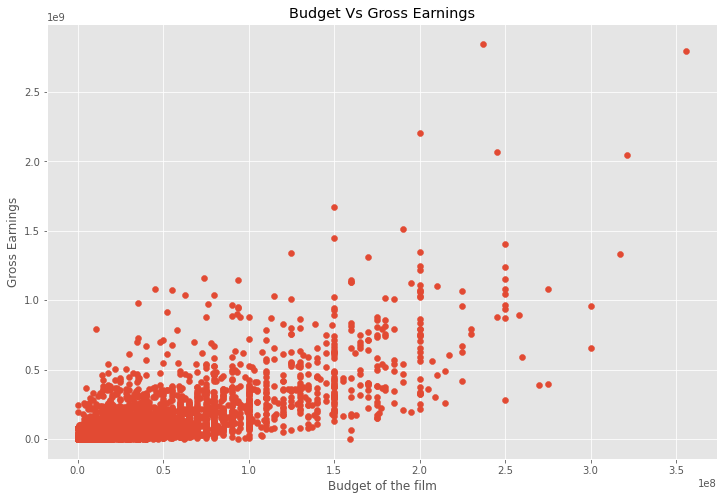

In [16]:
# Scatter plot with budget vs gross

plt.scatter(x = df["budget"],y = df["gross"])
plt.title("Budget Vs Gross Earnings")
plt.xlabel("Budget of the film")
plt.ylabel("Gross Earnings")
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

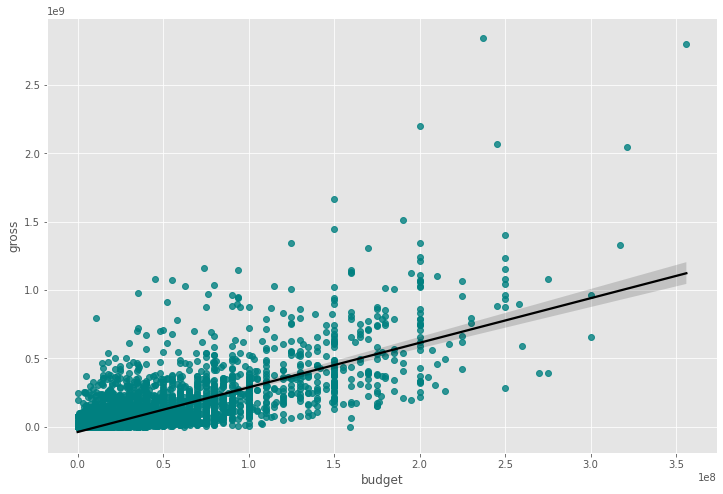

In [17]:
# Budget vs Gross plot using Seaborn

sns.regplot(x ="budget",y="gross",data=df, scatter_kws={"color":"teal"},line_kws={"color":"black"})

In [18]:
#Let's start looking at correlation
#Correlation works only on the numerical data
df.corr()#pearson - default method

,year,score,votes,budget,gross,runtime
year,1.000000,0.103908,0.223889,0.264290,0.249685,0.121801
score,0.103908,1.000000,0.408426,0.062496,0.182538,0.397709
votes,0.223889,0.408426,1.000000,0.418359,0.630981,0.305857
budget,0.264290,0.062496,0.418359,1.000000,0.709586,0.264418
gross,0.249685,0.182538,0.630981,0.709586,1.000000,0.242251
runtime,0.121801,0.397709,0.305857,0.264418,0.242251,1.000000


In [19]:
df.corr(method = "spearman")

,year,score,votes,budget,gross,runtime
year,1.000000,0.106023,0.471191,0.201597,0.261994,0.141868
score,0.106023,1.000000,0.430709,0.001979,0.118942,0.398017
votes,0.471191,0.430709,1.000000,0.227274,0.686153,0.286773
budget,0.201597,0.001979,0.227274,1.000000,0.356985,0.223540
gross,0.261994,0.118942,0.686153,0.356985,1.000000,0.225725
runtime,0.141868,0.398017,0.286773,0.223540,0.225725,1.000000


In [20]:
df.corr(method = "kendall")

,year,score,votes,budget,gross,runtime
year,1.000000,0.072430,0.332399,0.143621,0.178824,0.096470
score,0.072430,1.000000,0.302015,0.001622,0.081065,0.282243
votes,0.332399,0.302015,1.000000,0.156357,0.505674,0.195876
budget,0.143621,0.001622,0.156357,1.000000,0.255204,0.158814
gross,0.178824,0.081065,0.505674,0.255204,1.000000,0.154652
runtime,0.096470,0.282243,0.195876,0.158814,0.154652,1.000000


In [21]:
df.corr(method = "pearson")

,year,score,votes,budget,gross,runtime
year,1.000000,0.103908,0.223889,0.264290,0.249685,0.121801
score,0.103908,1.000000,0.408426,0.062496,0.182538,0.397709
votes,0.223889,0.408426,1.000000,0.418359,0.630981,0.305857
budget,0.264290,0.062496,0.418359,1.000000,0.709586,0.264418
gross,0.249685,0.182538,0.630981,0.709586,1.000000,0.242251
runtime,0.121801,0.397709,0.305857,0.264418,0.242251,1.000000


In [22]:
#High correlation between budget and gross

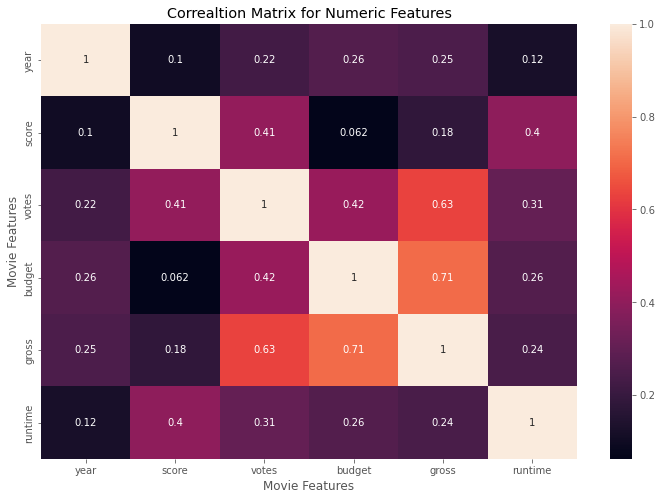

In [23]:
correlation_matrix = df.corr(method = "pearson")

sns.heatmap(correlation_matrix,annot=True)
plt.title("Correaltion Matrix for Numeric Features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show()

In [24]:
# Converting the object type columns into numerical data 
df_numerized = df

for col in df_numerized.columns:
    if (df_numerized[col].dtype =="object"):
        df_numerized[col] = df_numerized[col].astype("category")
        df_numerized[col] = df_numerized[col].cat.codes
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6587,6,6,1980,1692,8.400000,9.270000e+05,2559,3973,1034,54,19000000,4.699877e+07,2293,146.000000
1,5573,6,1,1980,1479,5.800000,6.500000e+04,2243,1613,320,55,4500000,5.885311e+07,724,104.000000
2,5142,4,0,1980,1757,8.700000,1.200000e+06,1100,2535,1728,55,18000000,5.383751e+08,1523,124.000000
3,286,4,4,1980,1479,7.700000,2.210000e+05,1289,1978,2224,55,3500000,8.345354e+07,1791,88.000000
4,1027,6,4,1980,1530,7.300000,1.080000e+05,1044,515,403,55,6000000,3.984634e+07,1756,98.000000
5,2109,6,10,1980,2485,6.400000,1.230000e+05,2499,4318,237,55,550000,3.975460e+07,1791,95.000000
6,5574,6,0,1980,1757,7.900000,1.880000e+05,1399,827,1261,55,27000000,1.152299e+08,2255,133.000000
7,4436,6,3,1980,693,8.200000,3.300000e+05,1810,1749,2218,55,18000000,2.340243e+07,626,129.000000
8,5281,4,0,1980,1739,6.800000,1.010000e+05,2280,1957,866,55,54000000,1.081857e+08,874,127.000000
9,6213,6,3,1980,2270,7.000000,1.000000e+04,2832,418,582,55,10000000,1.579519e+07,2246,100.000000


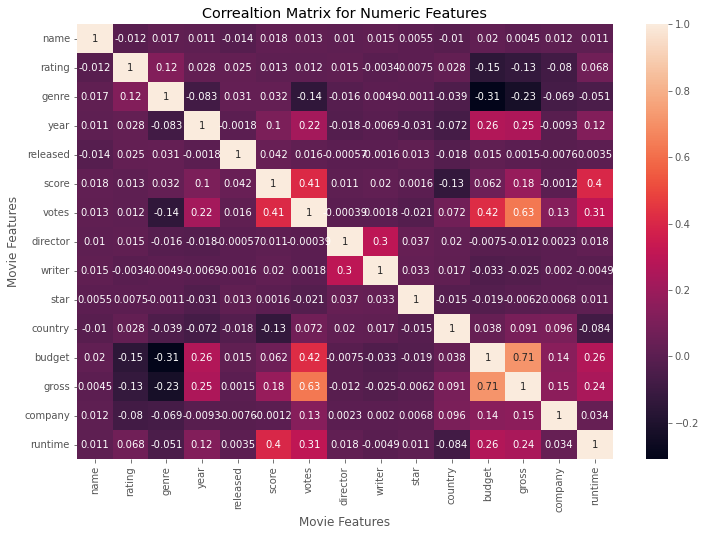

In [25]:
correlation_mat = df_numerized.corr(method = "pearson")

sns.heatmap(correlation_mat,annot=True)
plt.title("Correaltion Matrix for Numeric Features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show()

In [26]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.012143,0.017124,0.010934,-0.013569,0.018347,0.013292,0.010437,0.014806,0.005493,-0.010173,0.019774,0.004485,0.011571,0.010894
rating,-0.012143,1.000000,0.123856,0.028162,0.025201,0.012574,0.011801,0.015033,-0.003392,0.007528,0.027790,-0.154935,-0.127913,-0.079913,0.068071
genre,0.017124,0.123856,1.000000,-0.082602,0.030604,0.031683,-0.144266,-0.015947,0.004944,-0.001142,-0.039379,-0.308873,-0.232155,-0.068776,-0.050927
year,0.010934,0.028162,-0.082602,1.000000,-0.001795,0.103908,0.223889,-0.018273,-0.006919,-0.031062,-0.071950,0.264290,0.249685,-0.009308,0.121801
released,-0.013569,0.025201,0.030604,-0.001795,1.000000,0.042398,0.015838,-0.000567,-0.001570,0.013461,-0.018343,0.015246,0.001479,-0.007641,0.003497
score,0.018347,0.012574,0.031683,0.103908,0.042398,1.000000,0.408426,0.011357,0.019857,0.001605,-0.134951,0.062496,0.182538,-0.001243,0.397709
votes,0.013292,0.011801,-0.144266,0.223889,0.015838,0.408426,1.000000,-0.000394,0.001835,-0.021262,0.072352,0.418359,0.630981,0.134631,0.305857
director,0.010437,0.015033,-0.015947,-0.018273,-0.000567,0.011357,-0.000394,1.000000,0.301049,0.037442,0.020353,-0.007525,-0.011526,0.002336,0.018396
writer,0.014806,-0.003392,0.004944,-0.006919,-0.001570,0.019857,0.001835,0.301049,1.000000,0.033439,0.017082,-0.033408,-0.024802,0.001951,-0.004902
star,0.005493,0.007528,-0.001142,-0.031062,0.013461,0.001605,-0.021262,0.037442,0.033439,1.000000,-0.014898,-0.018617,-0.006245,0.006815,0.010821


In [27]:
corr_pairs = correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.012143
          genre       0.017124
          year        0.010934
          released   -0.013569
          score       0.018347
          votes       0.013292
          director    0.010437
          writer      0.014806
          star        0.005493
          country    -0.010173
          budget      0.019774
          gross       0.004485
          company     0.011571
          runtime     0.010894
rating    name       -0.012143
          rating      1.000000
          genre       0.123856
          year        0.028162
          released    0.025201
          score       0.012574
          votes       0.011801
          director    0.015033
          writer     -0.003392
          star        0.007528
          country     0.027790
          budget     -0.154935
          gross      -0.127913
          company    -0.079913
          runtime     0.068071
genre     name        0.017124
          rating      0.123856
        

In [28]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget    genre      -0.308873
genre     budget     -0.308873
          gross      -0.232155
gross     genre      -0.232155
rating    budget     -0.154935
budget    rating     -0.154935
genre     votes      -0.144266
votes     genre      -0.144266
score     country    -0.134951
country   score      -0.134951
rating    gross      -0.127913
gross     rating     -0.127913
runtime   country    -0.083833
country   runtime    -0.083833
year      genre      -0.082602
genre     year       -0.082602
rating    company    -0.079913
company   rating     -0.079913
country   year       -0.071950
year      country    -0.071950
genre     company    -0.068776
company   genre      -0.068776
genre     runtime    -0.050927
runtime   genre      -0.050927
genre     country    -0.039379
country   genre      -0.039379
writer    budget     -0.033408
budget    writer     -0.033408
year      star       -0.031062
star      year       -0.031062
gross     writer     -0.024802
writer    gross      -0.024802
star    

In [29]:
high_correlation = sorted_pairs[(sorted_pairs >0.5)]
high_correlation

gross     votes       0.630981
votes     gross       0.630981
gross     budget      0.709586
budget    gross       0.709586
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

## Result

1. Budget and votes have high correlation with the gross earnings of the movie/film.
2. Company has low correlation with the gross
